# Linear Regression From Scratch by Sujan Neupane

## Importing Dependencies

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

<b> loading data from file into pandas dataframe </b>

In [2]:
data = pd.read_csv('data.txt', delimiter = ',', names = ['Square_ft', 'Price']);data.head()

,Square_ft,Price
0,1,100
1,2,120
2,3,150
3,4,160
4,5,200


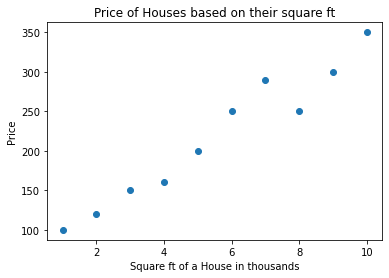

In [3]:
plt.xlabel('Square ft of a House in thousands')
plt.ylabel('Price')
plt.title("Price of Houses based on their square ft")
plt.scatter(data['Square_ft'], data['Price']);

```
Since there is one independent variable, a simple equation for the above dataset is:
    
    y = (W * Square_ft) + c
    
Where y is the prediction, and W is the weight for our feature Square_ft, and c is the y-intercept

w = weight
c = bias
    
```

In [4]:
data.corr()

,Square_ft,Price
Square_ft,1.000000,0.974339
Price,0.974339,1.000000


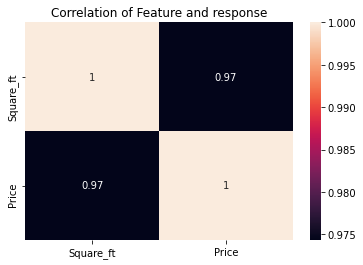

In [5]:
sns.heatmap(data.corr(), annot=True).set(title = 'Correlation of Feature and response');

```
Here's how correlation coefficients can be interpreted:

Strength: The greater the absolute value of the correlation coefficient, the stronger the relationship.

The extreme values of -1 and 1 indicate a perfectly linear relationship where a change in one variable is accompanied by a perfectly consistent change in the other. For these relationships, all of the data points fall on a line. In practice, you won’t see either type of perfect relationship.

A coefficient of zero represents no linear relationship. As one variable increases, there is no tendency in the other variable to either increase or decrease.

When the value is in-between 0 and +1/-1, there is a relationship, but the points don’t all fall on a line. As r approaches -1 or 1, the strength of the relationship increases and the data points tend to fall closer to a line.

Direction: The sign of the correlation coefficient represents the direction of the relationship.

Positive coefficients indicate that when the value of one variable increases, the value of the other variable also tends to increase. Positive relationships produce an upward slope on a scatterplot.

Negative coefficients represent cases when the value of one variable increases, the value of the other variable tends to decrease. Negative relationships produce a downward slope.
```

## Loss/Cost Function

<b> We will be using Mean Squared Error to calculate our loss </b>

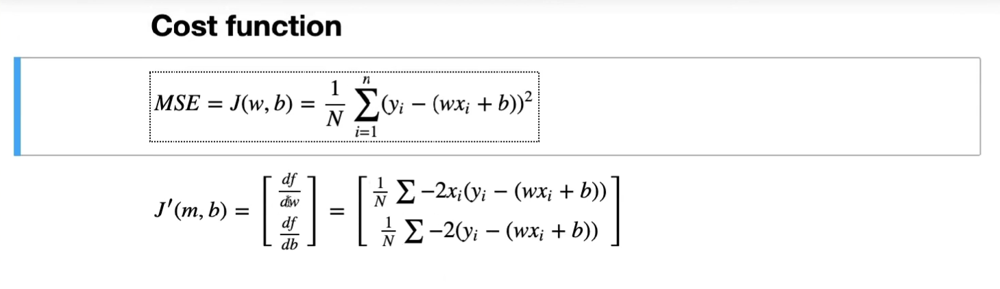

## Gradient Descent

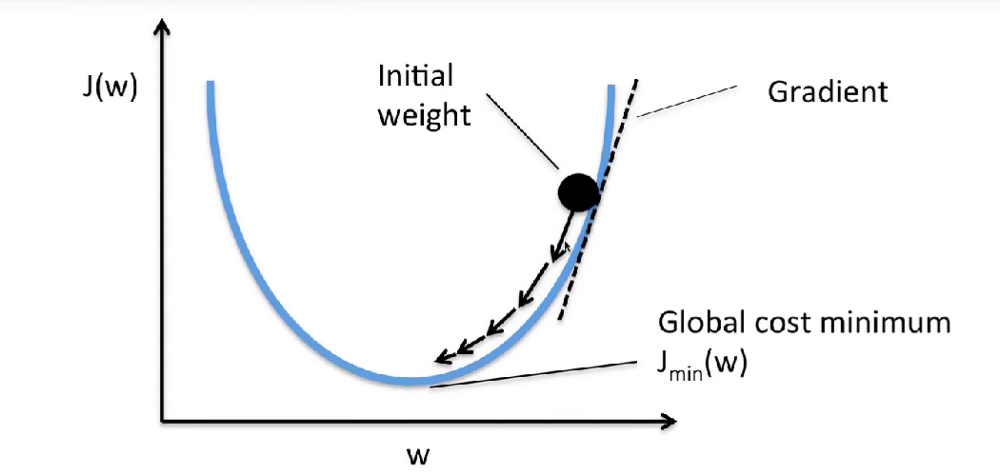

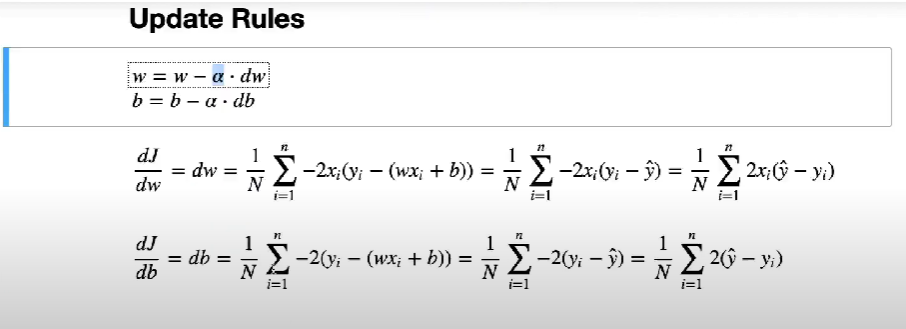

Derivative of loss wrt weight

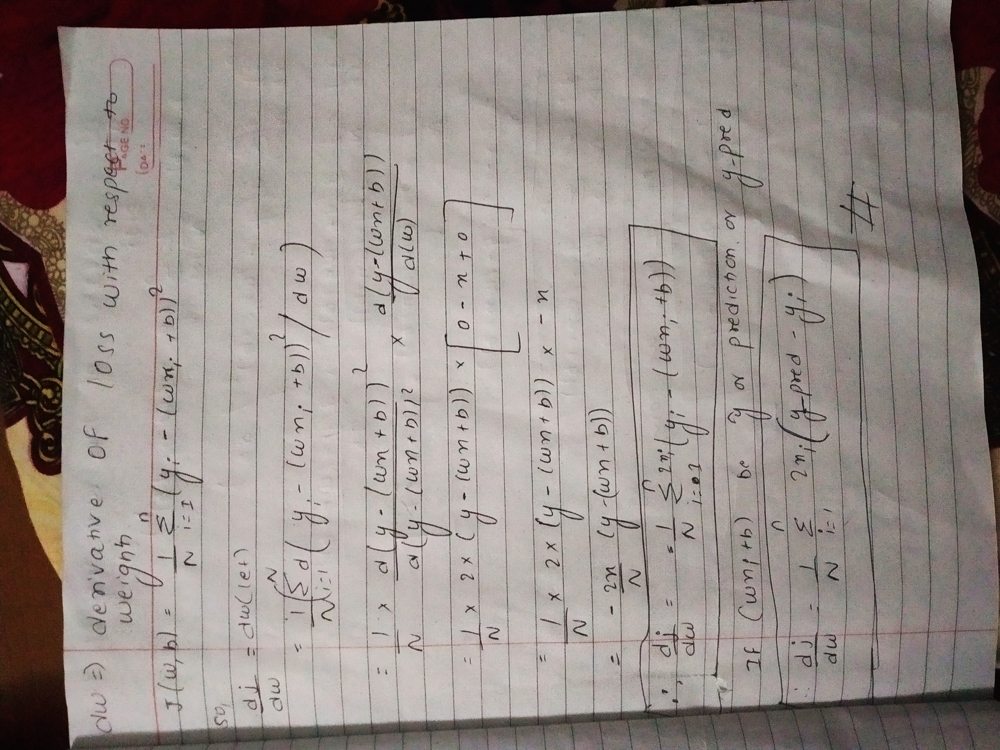

derivative of loss wrt bias/intercept

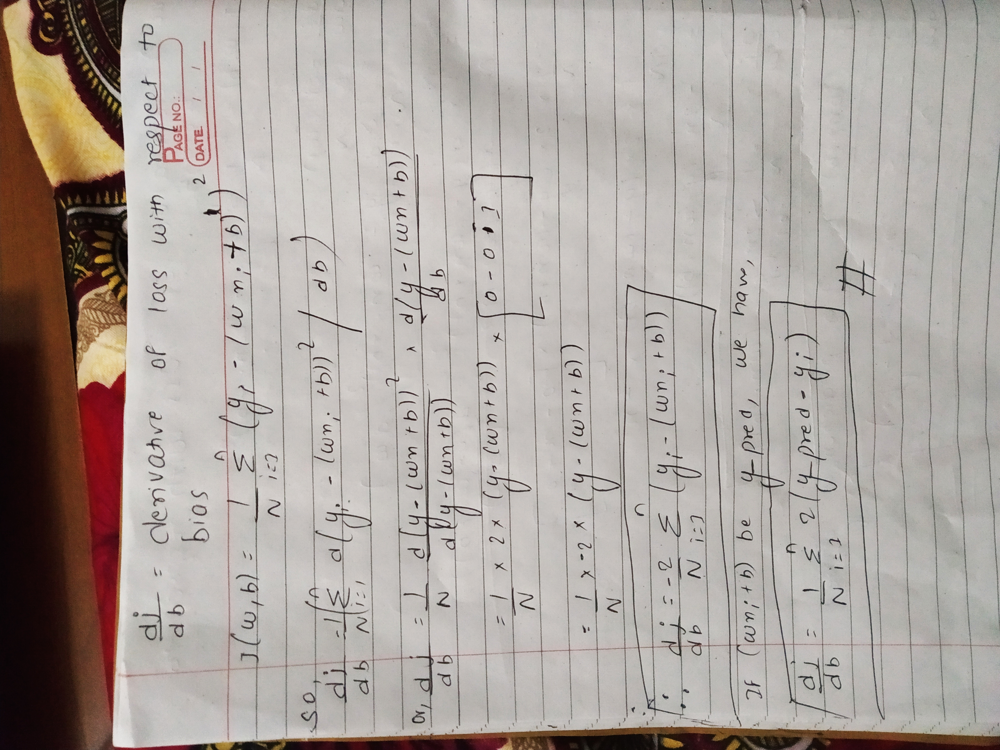

## Learning Rate

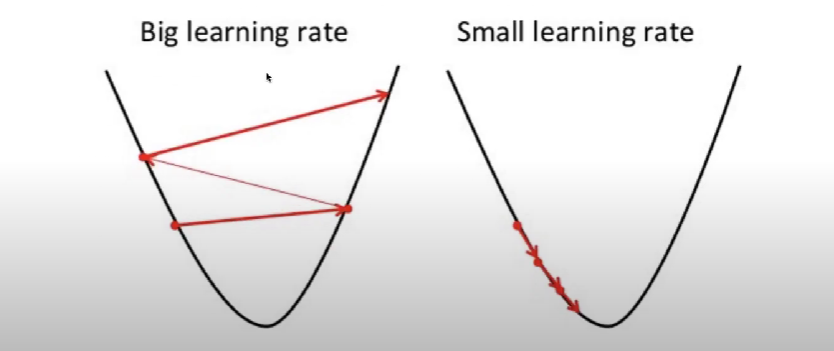

# Linear Regression From Absolute Scatch

In [6]:
X = data[['Square_ft']]
y = data['Price']

In [9]:
# our loss function i.e mean squared error

def mse(y, y_pred):
    return np.mean((y - y_pred)**2)

Backpropagation in neural network is a short form for “backward propagation of errors.” It is a standard method of training artificial neural networks. This method helps calculate the gradient of a loss function with respect to all the weights in the network.

In [10]:
class LinearRegression:
    def __init__(self): 
        self.lr = 0.001
        self.n_iters = 10000 # 30000 # epochs 
        self.weights = None
        self.bias = 0
        
    def fit(self, X, y):
        n_samples, n_features  = X.shape
        self.weights = np.zeros(n_features)
        
        for i in range(0, self.n_iters):
            y_pred = np.dot(X, self.weights) + self.bias
            dw = (1 / n_samples) * (np.dot(X.T, (y_pred - y)))
            db = (1 / n_samples) * (np.sum(y_pred - y))
            
            # weights = weights - dw*lr
            self.weights -= (self.lr * dw)
            self.bias  -= (self.lr * db)
            
            if ((i % 1000) ==0):
                print("In {}th epoch, loss(MSE) is {}:".format(i,mse(y, y_pred)))
    
    def predict(self, X):
        y_pred = np.dot(X, self.weights) + self.bias
        return y_pred

In [11]:
lin_reg = LinearRegression()

In [12]:
lin_reg.fit(X,y)

In 0th epoch, loss(MSE) is 53410.0:
In 1000th epoch, loss(MSE) is 887.7241499554009:
In 2000th epoch, loss(MSE) is 693.1052192935606:
In 3000th epoch, loss(MSE) is 565.231218830787:
In 4000th epoch, loss(MSE) is 481.2118485735047:
In 5000th epoch, loss(MSE) is 426.0070801852236:
In 6000th epoch, loss(MSE) is 389.7348914807428:
In 7000th epoch, loss(MSE) is 365.9023184653171:
In 8000th epoch, loss(MSE) is 350.24317142119435:
In 9000th epoch, loss(MSE) is 339.9543584595916:


In [13]:
lin_reg.weights

array([28.08635377])

In [14]:
lin_reg.bias

60.892700372042334

```
Our trained model's parameters are 27.74 and 63.29 respectively

so, the equation of line of best fit is as follows:
    y = (27.71) * Square_fit + (63.2923)
    
where weight = 27.71 and Square_fit = 63.29 respectively
```

In [15]:
y_pred = lin_reg.predict(X)

In [16]:
y_pred

array([ 88.97905414, 117.06540791, 145.15176168, 173.23811545,
       201.32446922, 229.410823  , 257.49717677, 285.58353054,
       313.66988431, 341.75623808])

In [17]:
mse(y,y_pred)

333.19411335425

# Another Example

In [18]:
X1 = np.array([
    [1],
    [2],
    [3],
    [4],
    [5]
])
y1 = np.array([100,200,300,400,500])

In [19]:
lin_reg1 = LinearRegression()

In [20]:
lin_reg1.fit(X1,y1)

In 0th epoch, loss(MSE) is 110000.0:
In 1000th epoch, loss(MSE) is 85.8956222508453:
In 2000th epoch, loss(MSE) is 61.252705187207425:
In 3000th epoch, loss(MSE) is 43.67968954735319:
In 4000th epoch, loss(MSE) is 31.14826150325887:
In 5000th epoch, loss(MSE) is 22.212021301652648:
In 6000th epoch, loss(MSE) is 15.839532175927625:
In 7000th epoch, loss(MSE) is 11.295270076730084:
In 8000th epoch, loss(MSE) is 8.054728175631984:
In 9000th epoch, loss(MSE) is 5.743877352431045:


# Bonus

In [22]:
def estimate_charges(Square_ft, weights, bias):
    return weights * Square_ft + bias

In [23]:
def try_parameters(w, b):
    X = data[['Square_ft']]
    y = data['Price']
    
    estimated_charges = estimate_charges(X, w, b)
    
    plt.plot(X, estimated_charges, 'r', alpha=0.9);
    plt.scatter(X, y, s=8,alpha=0.8);
    plt.title("Line of Best Fit for our Linear Regression Model")
    plt.xlabel('Age');
    plt.ylabel('Charges')
    plt.legend(['Estimate', 'Actual']);

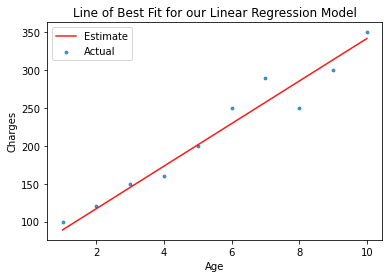

In [24]:
w = lin_reg.weights[0]
b = lin_reg.bias

try_parameters(w,b)

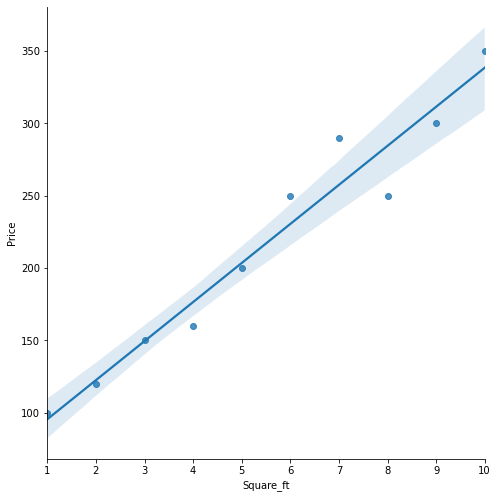

In [25]:
sns.pairplot(data,x_vars = ['Square_ft'],y_vars='Price',height = 7, aspect = 1,kind="reg");

# Thank You
## Please, Like and Follow me on GitHub